# Part 1 - Introduction
### 1.1 Background Information
Health insurance cost is one of the biggest cost for people in the United States (US), however,
there is a great problem with US health care. Especially for those low-income people, financial difficulty of accessing health care is greater than any other high-income country[1][2]. Hence, we want to figure out how insurance cost is related with people's information including region, sex, bmi and etc.

### 1.2 Research Question and Motivation
By exploring the relationship between all explanatory variables and the response variable, our
team aims to answer the research question of “what are the primary factors impacting one’s
health insurance cost”. This will allow us to generate insights on the subject, while enabling
others to use the optimal model we’ve identified for prediction purposes (i.e. to project health
insurance costs given a specific instance). \\
Understanding the relationship between insurance costs and personal attributes such as sex, BMI, and region is crucial for tailoring risk assessment and premium calculation, enabling the delivery of fair and personalized insurance policies. Exploring these factors through data-driven analysis can enhance the insurance industry's ability to offer competitive pricing while maintaining financial sustainability. \\
One key limitation we’ve identified is the data source, which is based on US samples collected a
long time ago. Despite this limitation, we believe our results will reveal meaningful insights for
the present audience, given similarities in the US and Canadian demographic, as well as the
consistency in health metrics employed in the industry.

### 1.3 Dataset Description
This research explores the relationship between a person's insurance cost and their health condition, sex, age, number of children and region.
The dataset used was collected as part of a study containing 1338 individuals, with 7 variables on each individual's information.
1. **age**: Age of primary beneficiary

2. **sex**: Insurance contractor’s gender (male, female)

3. **bmi**: Body mass index, a measure of body fat based on
height and weight that applies to adult men and
women in unit (𝑘𝑔/𝑚2), ideally within the range
of 18.5 to 24.9

4. **children**:Number of children covered by health insurance /
Number of dependents

5. **smoker**: Whether the primary beneficiary smokes or not
(yes, no)

6. **region**: The beneficiary's residential area in the US
(northeast, southeast, southwest, northwest)

7. **charges**: Annual health insurance cost (in USD)




# Part 2 - Analysis
## 2.1 - Exploratory Data Analysis (EDA)
### 2.1.1 Visualizing Variable Distributions
In this section, we will use histogram to identify patterns, value ranges, and distributions of the response variable in the given dataset to better understand the nature of the data we will be working with throughout this report.

In [1]:
install.packages("ggplot2")
install.packages("gridExtra")
install.packages("shiny")

In [2]:
library(tidyverse)
library(ggplot2)
library(gridExtra)
library(shiny)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.4.2     ✔ purrr   1.0.1
✔ tibble  3.2.1     ✔ dplyr   1.1.1
✔ tidyr   1.3.0     ✔ stringr 1.5.0
✔ readr   2.1.3     ✔ forcats 0.5.2
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()

Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine




In [3]:
options(repr.plot.width = 10, repr.plot.height = 5)

In [4]:
insurance <- read.csv("https://raw.githubusercontent.com/west352/file/main/insurance.csv")
insurance$sex <- as.factor(insurance$sex)
insurance$smoker <- as.factor(insurance$smoker)
insurance$region <- as.factor(insurance$region)
head(insurance)

,age,sex,bmi,children,smoker,region,charges
,<int>,<fct>,<dbl>,<int>,<fct>,<fct>,<dbl>
1,19,female,27.900,0,yes,southwest,16884.924
2,18,male,33.770,1,no,southeast,1725.552
3,28,male,33.000,3,no,southeast,4449.462
4,33,male,22.705,0,no,northwest,21984.471
5,32,male,28.880,0,no,northwest,3866.855
6,31,female,25.740,0,no,southeast,3756.622


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


Shiny tags cannot be represented in plain text (need html)

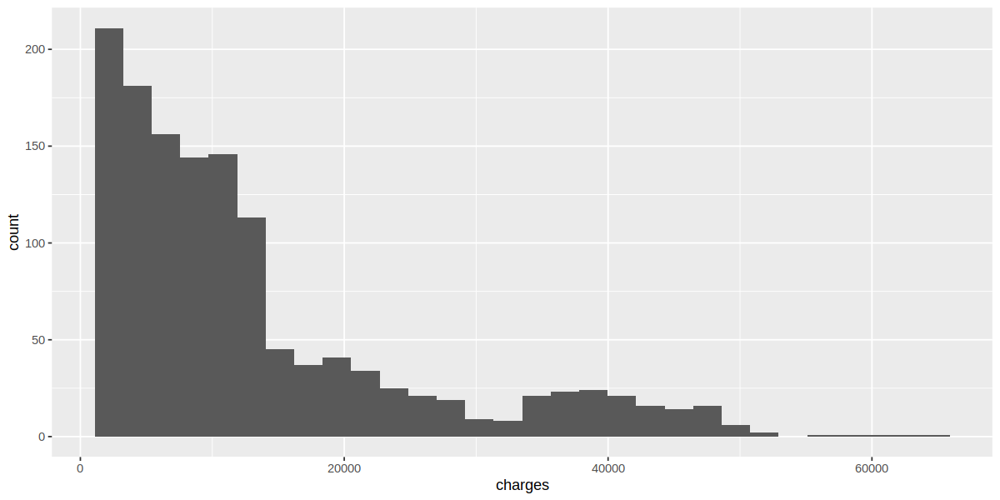

In [5]:
#initial exploratory data analysis
response_histogram <- ggplot(insurance, aes(x=charges)) + geom_histogram()
response_histogram
h3("Figure 1: Distriution of the Response Variable (Medical Insurance Cost)")

### 2.1.2 Preliminary Exploration of Relationships between Variables
In this section, we will look into explanatory variable's relationship with the response variable (insurance cost) for initial insights on candidate predictors, using box plots.

Shiny tags cannot be represented in plain text (need html)

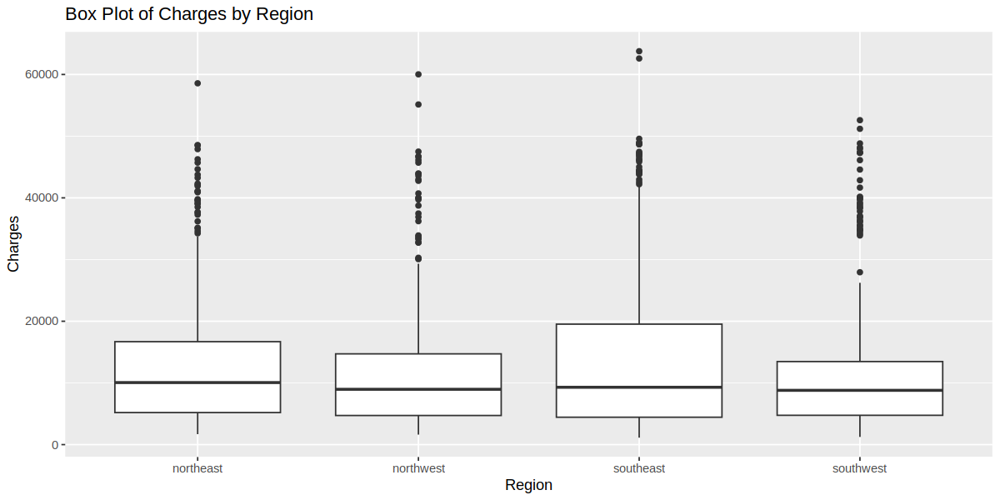

In [6]:
tags$div(HTML("<h3>Figure 2: Distriutions of the Response Variable (Medical Insurance Cost) <br> across Various Regions of the United States</h3>"))
ggplot(insurance, aes(x = region, y = charges)) +
  geom_boxplot() +
  labs(x = "Region", y = "Charges") +
  ggtitle("Box Plot of Charges by Region")

Shiny tags cannot be represented in plain text (need html)

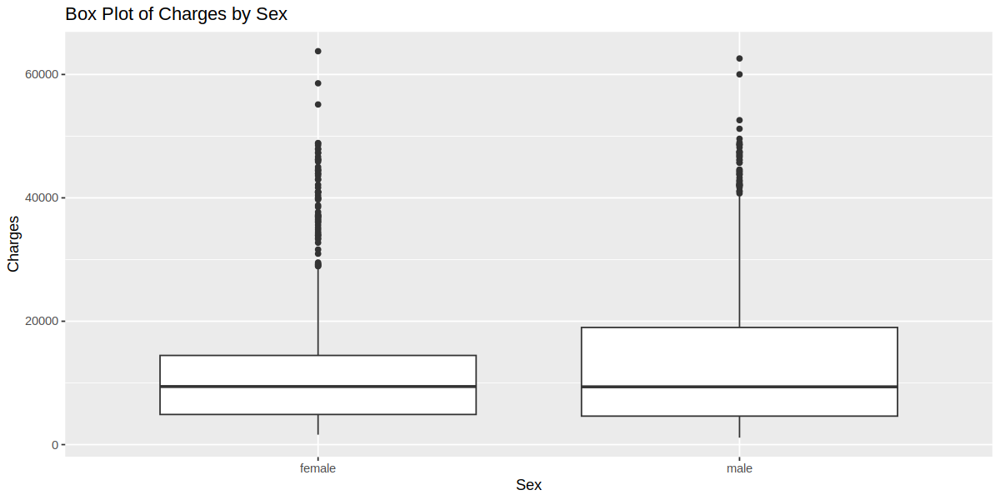

In [7]:
tags$div(HTML("<h3>Figure 3: Distriutions of the Response Variable (Medical Insurance Cost) <br> across Different Biological Sex</h3>"))
ggplot(insurance, aes(x = sex, y = charges)) +
  geom_boxplot() +
  labs(x = "Sex", y = "Charges") +
  ggtitle("Box Plot of Charges by Sex")

Shiny tags cannot be represented in plain text (need html)

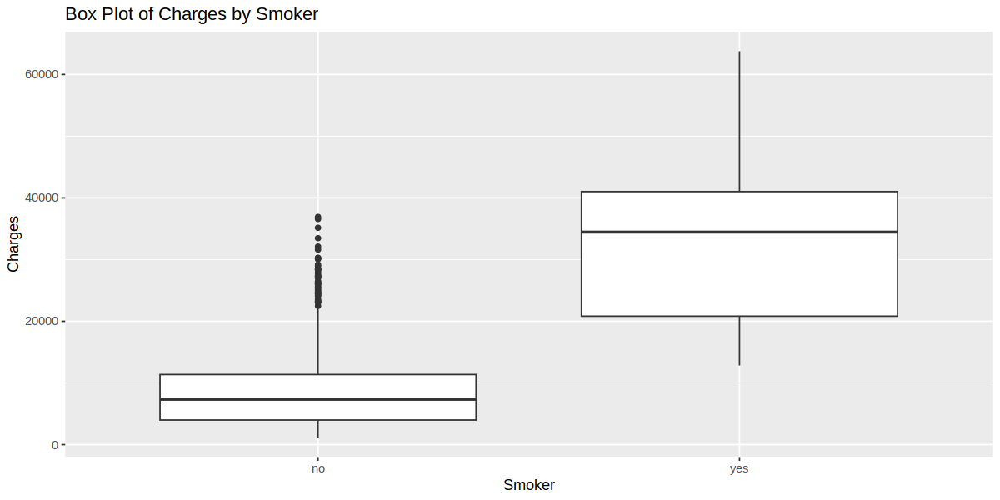

In [8]:
tags$div(HTML("<h3>Figure 4: Distriutions of the Response Variable (Medical Insurance Cost) <br> based on Beneficiary's Smoking Habit</h3>"))
ggplot(insurance, aes(x = smoker, y = charges)) +
  geom_boxplot() +
  labs(x = "Smoker", y = "Charges") +
  ggtitle("Box Plot of Charges by Smoker")

### 2.1.3 Key Observations from EDA
The key takeaways from the preliminary EDA above include the following:

1.   ***Figure 1:*** The response variable (medical insurance cost) follows a *right-skewed distrbution*, wich few extremely high cost in the right tail. The majority of the sample's medical insurance cost falls below $20,000.
2.   ***Figure 2:*** On average, the overall medical insurance cost does not vary systematically and/or significanlty across the four regions of the United States (Northeast. Northwest, Southeast, Southwest).
3.   ***Figure 3:*** Similarly, the overall medical insurance cost does not vary systematically and/or significanlty by sex.
4.   ***Figure 4:*** The overall medical insurance cost does appear to *vary systematically and significanlty with respect to the beneficiary's smoking habits*, where individuals who does smoke will likely have a higher insurance cost.

# Part 2.2 - Detailed Analysis
Our exploratory analysis above highlighted potential variables of interest and preliminary relationships. We will now refine these insights through a regression analysis, focusing on identifying the most significant predictors of medical insurance costs. **As a high level overview, in this section we will proceed with the following:**


*   Initial model creation using all variables;
*   Backward model selection based on p-values to exclude non-significant variables, while keeping variables believed to be important despite high p-values;
*   Creating diagnostic plots for model residuals to check for homoscedasticity and normality;
*   Introducing interaction terms and polynomial terms to address non-linearity; and
*   Reassessing the model fit through residual analysis.



In [9]:
full_model <- lm(charges~age + sex + bmi + children + smoker + region, data=insurance)
summary(full_model)


Call:
lm(formula = charges ~ age + sex + bmi + children + smoker + 
    region, data = insurance)

Residuals:
     Min       1Q   Median       3Q      Max 
-11304.9  -2848.1   -982.1   1393.9  29992.8 

Coefficients:
                Estimate Std. Error t value Pr(>|t|)    
(Intercept)     -11938.5      987.8 -12.086  < 2e-16 ***
age                256.9       11.9  21.587  < 2e-16 ***
sexmale           -131.3      332.9  -0.394 0.693348    
bmi                339.2       28.6  11.860  < 2e-16 ***
children           475.5      137.8   3.451 0.000577 ***
smokeryes        23848.5      413.1  57.723  < 2e-16 ***
regionnorthwest   -353.0      476.3  -0.741 0.458769    
regionsoutheast  -1035.0      478.7  -2.162 0.030782 *  
regionsouthwest   -960.0      477.9  -2.009 0.044765 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 6062 on 1329 degrees of freedom
Multiple R-squared:  0.7509,	Adjusted R-squared:  0.7494 
F-statistic: 500.8 on 8 and 1

While the full model above takes into considearation all available variables, which enables us to capture the broadest possible picture, it may not be the most effective model in this scenario. As shwon in the EDA, variables such as 'Sex' demonstrates minimal effect on one's insurance cost. Therefore, to identify the most accurate and effective model without overfitting or underfitting, we'll employ backward selection to retain only significant predictors.

**Specifically, we will employ backward selection to select a more optimal model and set the p-value to be no more than 0.05.**

We remove "sex" first since it has the largest p-value (0.693348).

In [10]:
model1 <- lm(charges~age + bmi + children + smoker + region, data=insurance)
summary(model1)


Call:
lm(formula = charges ~ age + bmi + children + smoker + region, 
    data = insurance)

Residuals:
     Min       1Q   Median       3Q      Max 
-11367.2  -2835.4   -979.7   1361.9  29935.5 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)     -11990.27     978.76 -12.250  < 2e-16 ***
age                256.97      11.89  21.610  < 2e-16 ***
bmi                338.66      28.56  11.858  < 2e-16 ***
children           474.57     137.74   3.445 0.000588 ***
smokeryes        23836.30     411.86  57.875  < 2e-16 ***
regionnorthwest   -352.18     476.12  -0.740 0.459618    
regionsoutheast  -1034.36     478.54  -2.162 0.030834 *  
regionsouthwest   -959.37     477.78  -2.008 0.044846 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 6060 on 1330 degrees of freedom
Multiple R-squared:  0.7509,	Adjusted R-squared:  0.7496 
F-statistic: 572.7 on 7 and 1330 DF,  p-value: < 2.2e-16


All the explanatory variables are significant except for the regionnorthwest. However, since we believe that geographical regions do have an impact on the medical insurance costs in US and the research from [3] also supports our belief, we decided to keep this term.

Next, we will apply model diagonostic method to see if model1 is appropriate for linear regression.

Shiny tags cannot be represented in plain text (need html)

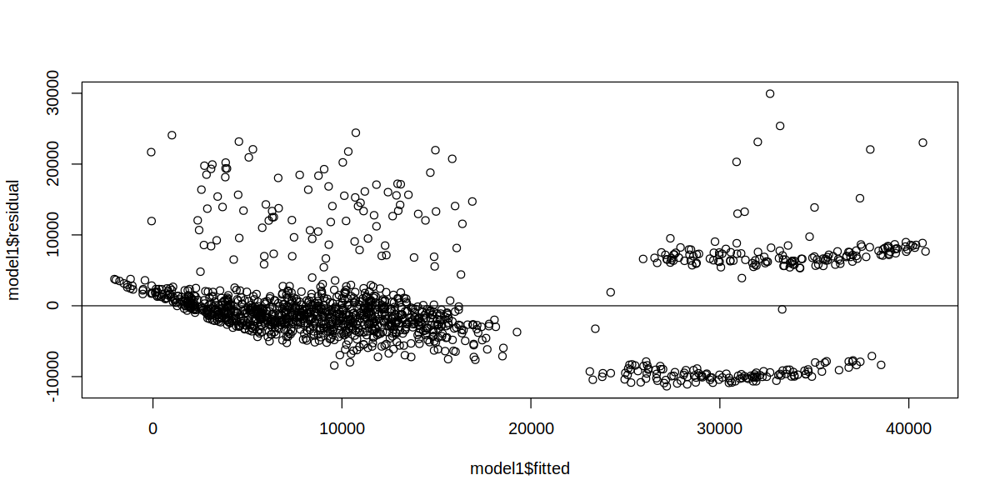

In [11]:
h3("Figure 5: Model 1 Residual Plot against the Fitted Values")
plot(x=model1$fitted, y=model1$residual)
abline(0,0)

Shiny tags cannot be represented in plain text (need html)

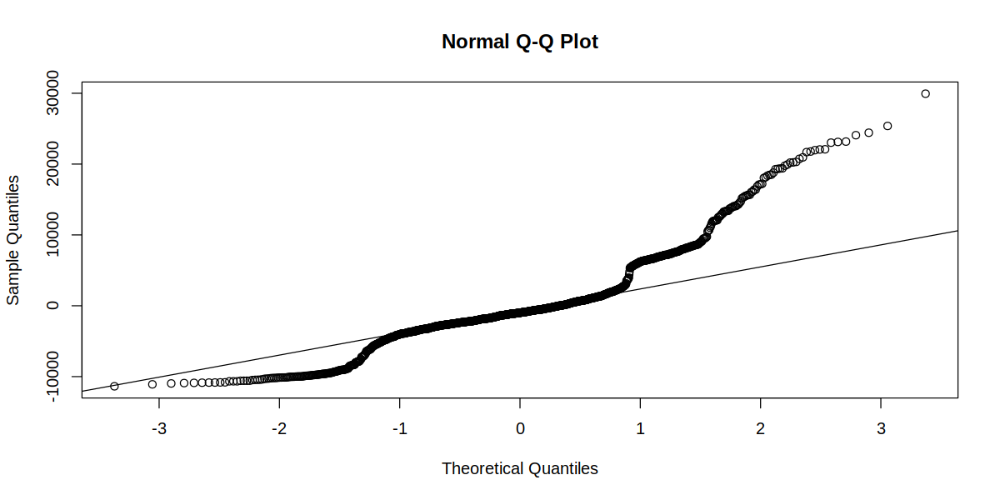

In [12]:
h3("Figure 6: Model 1 Normal Q-Q Plot")
qqnorm(model1$residuals)
qqline(model1$residuals)

Shiny tags cannot be represented in plain text (need html)

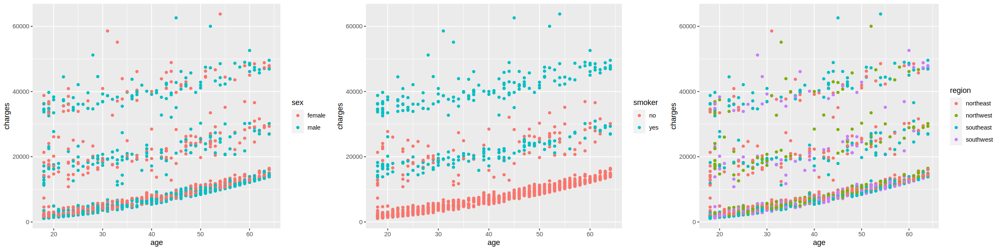

In [13]:
options(repr.plot.width = 20, repr.plot.height = 5)
plot_age_sex <- ggplot(insurance, aes(x=age, y=charges, color=sex)) +
    geom_point()
plot_age_smoker <- ggplot(insurance, aes(x=age, y=charges, color=smoker)) +
    geom_point()
plot_age_region <- ggplot(insurance, aes(x=age, y=charges, color=region)) +
    geom_point()

h3("Figure 7: Scatter Plots of Charges versus Age with Different Categorical Variables")
grid.arrange(plot_age_sex, plot_age_smoker, plot_age_region, ncol = 3)

Shiny tags cannot be represented in plain text (need html)

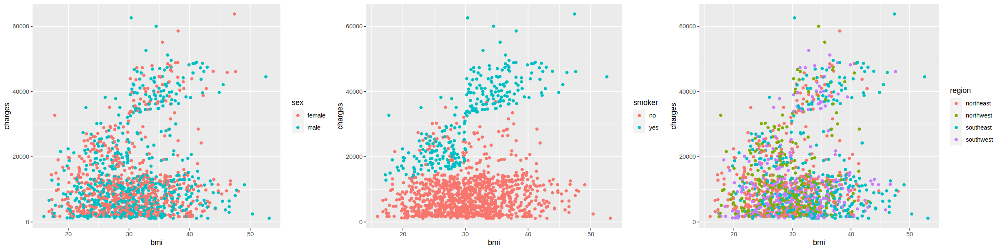

In [14]:
plot_bmi_sex <- ggplot(insurance, aes(x=bmi, y=charges, color=sex)) +
    geom_point()
plot_bmi_smoker <- ggplot(insurance, aes(x=bmi, y=charges, color=smoker)) +
    geom_point()
plot_bmi_region <- ggplot(insurance, aes(x=bmi, y=charges, color=region)) +
    geom_point()

h3("Figure 8: Scatter Plots of Charges versus BMI with Different Categorical Variables")
grid.arrange(plot_bmi_sex, plot_bmi_smoker, plot_bmi_region, ncol = 3)

We decide to add interaction terms for age*smoker and bmi*smoker base on the above plots to address the problem in residual plot (3 clusters) and QQplot.

In [15]:
model2 <- lm(charges~age*smoker + bmi*smoker + children + region, data=insurance)
summary(model2)


Call:
lm(formula = charges ~ age * smoker + bmi * smoker + children + 
    region, data = insurance)

Residuals:
     Min       1Q   Median       3Q      Max 
-14695.2  -1918.6  -1316.2   -480.3  30345.6 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)      -2469.101    870.166  -2.838  0.00462 ** 
age                264.558     10.672  24.791  < 2e-16 ***
smokeryes       -20223.654   1831.889 -11.040  < 2e-16 ***
bmi                 22.444     25.679   0.874  0.38228    
children           512.956    110.331   4.649 3.66e-06 ***
regionnorthwest   -581.232    381.383  -1.524  0.12774    
regionsoutheast  -1205.652    383.462  -3.144  0.00170 ** 
regionsouthwest  -1228.623    382.837  -3.209  0.00136 ** 
age:smokeryes       -2.542     23.711  -0.107  0.91464    
smokeryes:bmi     1438.525     52.793  27.249  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 4853 on 1328 degrees of freedom
Multi

Since the interaction term age:smokeryes has a very large p-value (0.91464), we decide to remove this term and fit a new model.

In [16]:
options(repr.plot.width = 10, repr.plot.height = 5)
model3 <- lm(charges~age + bmi*smoker + children + region, data=insurance)
summary(model3)


Call:
lm(formula = charges ~ age + bmi * smoker + children + region, 
    data = insurance)

Residuals:
     Min       1Q   Median       3Q      Max 
-14655.4  -1918.9  -1313.4   -489.7  30333.1 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)      -2453.564    857.695  -2.861  0.00429 ** 
age                264.042      9.522  27.729  < 2e-16 ***
bmi                 22.615     25.620   0.883  0.37756    
smokeryes       -20309.092   1648.861 -12.317  < 2e-16 ***
children           512.713    110.266   4.650 3.65e-06 ***
regionnorthwest   -581.704    381.215  -1.526  0.12727    
regionsoutheast  -1207.011    383.109  -3.151  0.00167 ** 
regionsouthwest  -1227.601    382.576  -3.209  0.00136 ** 
bmi:smokeryes     1438.108     52.630  27.325  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 4851 on 1329 degrees of freedom
Multiple R-squared:  0.8405,	Adjusted R-squared:  0.8395 
F-statistic: 87

Check the residual plot and normal plot to see if the model has been improved:

Shiny tags cannot be represented in plain text (need html)

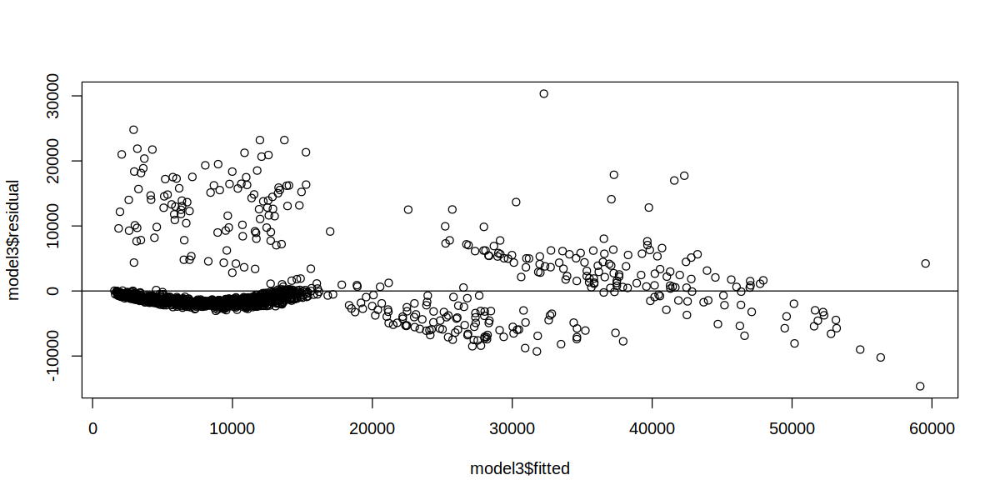

In [17]:
h3("Figure 9: Model 3 Residual Plot against the Fitted Values")
plot(x=model3$fitted, y=model3$residual)
abline(0,0)

Shiny tags cannot be represented in plain text (need html)

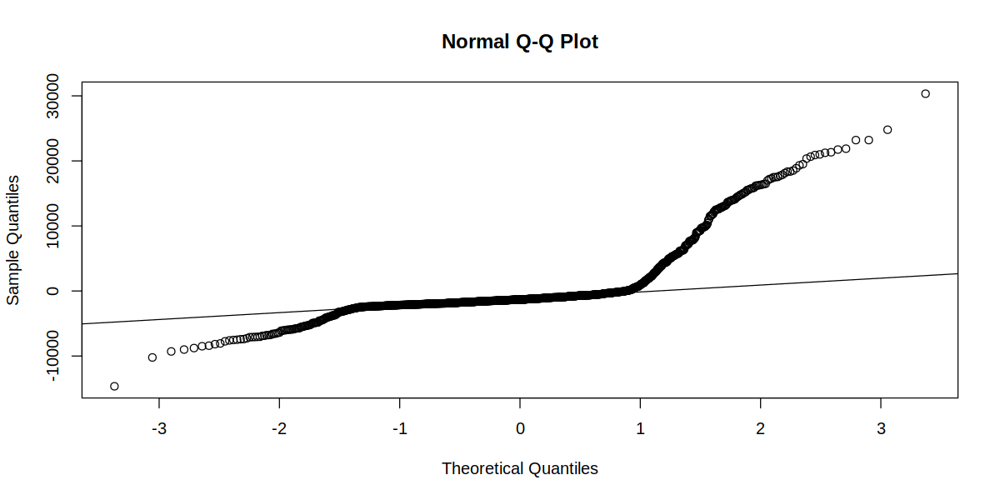

In [18]:
h3("Figure 10: Model 3 Normal Q-Q Plot")
qqnorm(model3$residuals)
qqline(model3$residuals)

Shiny tags cannot be represented in plain text (need html)

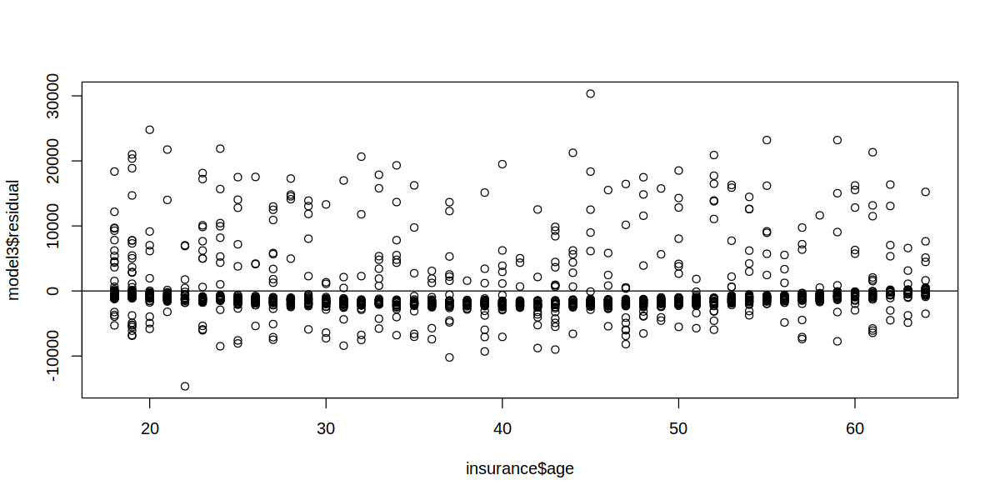

In [19]:
h3("Figure 11: Model 3 Residual Plot against Age")
plot(x=insurance$age, y=model3$residual)
abline(0,0)

Figure 9 shows a linear pattern and a clustering below the residual = 0 line.
Based on Figure 10, we can see that the distribution of residuals has obvious improvment after adding the interaction term. It becomes more Normal-like with heavy tails.
In order to further explore the underlying pattern from Figure 9, we made a residual plot against the continous variable age. From Figure 11, we can see that there is a slight quadratic pattern, so we decided to add age^2 into the model.

In [20]:
model4 <- lm(charges~I(age^2)+ age + bmi*smoker + children + region, data=insurance)
summary(model4)


Call:
lm(formula = charges ~ I(age^2) + age + bmi * smoker + children + 
    region, data = insurance)

Residuals:
     Min       1Q   Median       3Q      Max 
-14960.9  -1641.5  -1307.5   -861.8  31122.0 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)      2.611e+03  1.386e+03   1.884  0.05981 .  
I(age^2)         3.735e+00  8.066e-01   4.631 4.00e-06 ***
age             -3.216e+01  6.466e+01  -0.497  0.61900    
bmi              1.925e+01  2.544e+01   0.757  0.44919    
smokeryes       -2.024e+04  1.636e+03 -12.366  < 2e-16 ***
children         6.710e+02  1.146e+02   5.853 6.08e-09 ***
regionnorthwest -5.955e+02  3.783e+02  -1.574  0.11575    
regionsoutheast -1.203e+03  3.802e+02  -3.165  0.00159 ** 
regionsouthwest -1.225e+03  3.797e+02  -3.226  0.00129 ** 
bmi:smokeryes    1.436e+03  5.223e+01  27.494  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 4814 on 1328 degrees of freedom
Mul

The p-value associated with the estimate of the coefficient on the age variabe becomes 0.619. Next, we will check the correlation between age^2 and age to see if collinearity is a concern.

In [21]:
cor(insurance$age^2, insurance$age)

[1] 0.9883805

The result shows that age^2 and age are highly correlated with an approximate 0.988 correlation coefficient. Therefore, we decide to adjust the quadratic term by sbtracting the mean age before squaring.

In [22]:
age_mean <- mean(insurance$age)
model5 <- lm(charges~I((age-age_mean)^2)+ age + bmi*smoker + children + region, data=insurance)
summary(model5)


Call:
lm(formula = charges ~ I((age - age_mean)^2) + age + bmi * smoker + 
    children + region, data = insurance)

Residuals:
     Min       1Q   Median       3Q      Max 
-14960.9  -1641.5  -1307.5   -861.8  31122.0 

Coefficients:
                        Estimate Std. Error t value Pr(>|t|)    
(Intercept)           -3.131e+03  8.637e+02  -3.625  0.00030 ***
I((age - age_mean)^2)  3.735e+00  8.066e-01   4.631 4.00e-06 ***
age                    2.607e+02  9.477e+00  27.512  < 2e-16 ***
bmi                    1.925e+01  2.544e+01   0.757  0.44919    
smokeryes             -2.024e+04  1.636e+03 -12.366  < 2e-16 ***
children               6.710e+02  1.146e+02   5.853 6.08e-09 ***
regionnorthwest       -5.955e+02  3.783e+02  -1.574  0.11575    
regionsoutheast       -1.203e+03  3.802e+02  -3.165  0.00159 ** 
regionsouthwest       -1.225e+03  3.797e+02  -3.226  0.00129 ** 
bmi:smokeryes          1.436e+03  5.223e+01  27.494  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0

The p-value of age (< 2e-16) becomes significant again in the new model. Next, we will plot the residual plot and QQ plot to see if the model has been improved.

Shiny tags cannot be represented in plain text (need html)

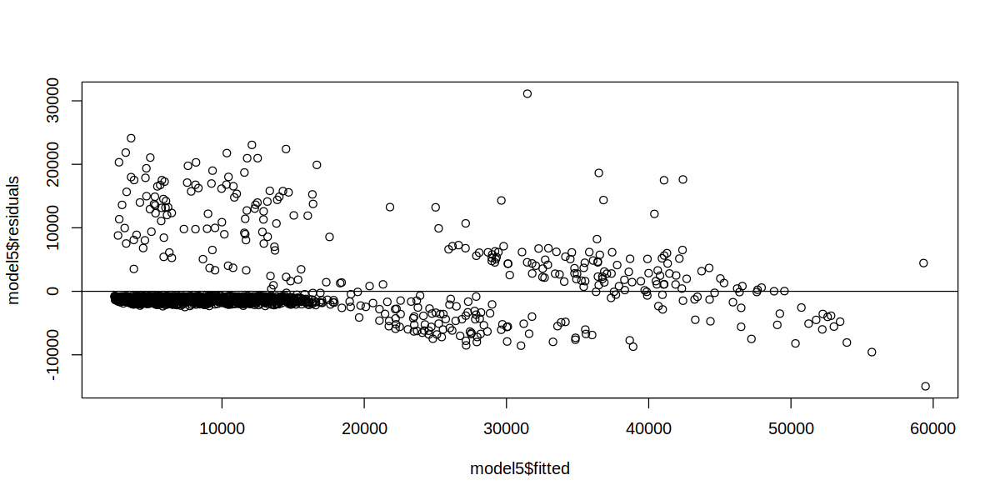

In [23]:
h3("Figure 12: Model 5 Residual Plot against Fitted Values")
plot(x=model5$fitted, y=model5$residuals)
abline(0,0)

Shiny tags cannot be represented in plain text (need html)

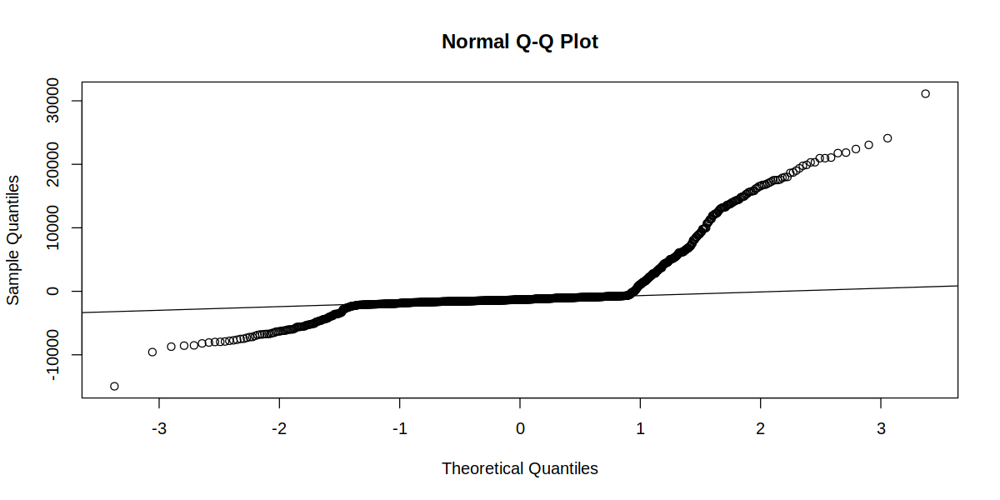

In [24]:
h3("Figure 13: Model 5 Normal Q-Q Plot")
qqnorm(model5$residuals)
qqline(model5$residuals)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


Shiny tags cannot be represented in plain text (need html)

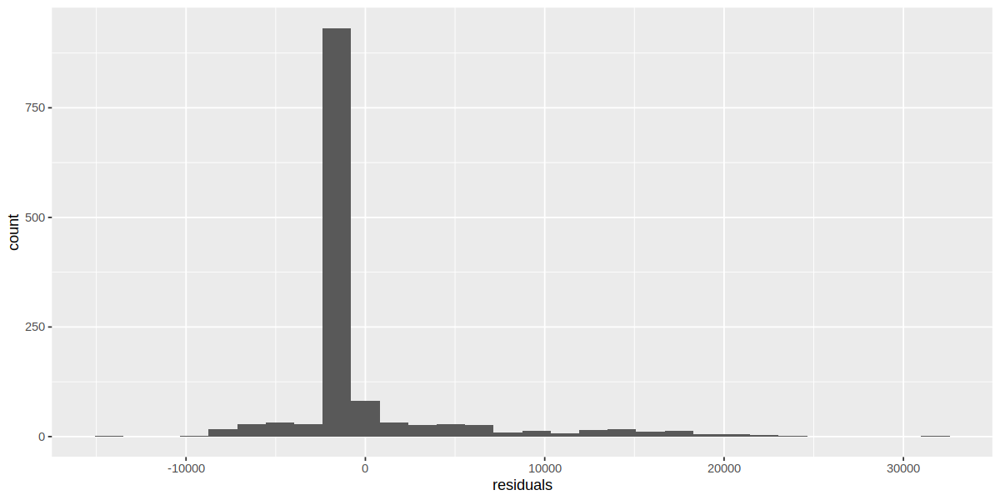

In [25]:
model5_residuals <- data.frame(residuals=model5$residuals)
residuals_histogram <- ggplot(model5_residuals, aes(x=residuals)) + geom_histogram()
residuals_histogram
h3("Figure 14: Distribution of Model 5 Residuals")

Comparing to Figure 9 and Figure 10, the residual plot against fitted vales(Figure 12) and the Normal Q-Q plot (Figure 13) do not have any substantial improvement. The problems with linear pattern and clustring still exist, and the residual distribution still have heavy tails. From Figure 14, we can see that the distribution of residuals in the model 5 is right-skewed. The clustering and heavy tails problems are reflected in Figure 14 as well.

The above diagnostic plots reveal insights into our model's assumptions. Adjustments, including adding interaction and polynomial terms, aim to address any identified issues and improve model fit.

# Part 3 - Conclusion
### **3.1 Summary of Key Findings**

Our analysis aimed to identify the most significant predictors of health insurance costs, leveraging a dataset of medical insurance costs in the U.S. Through comprehensive exploratory data analysis, we visualized the distributions of and relationships between variables. Our regression modeling, refined through backward selection and enhanced by diagnostic checks, highlighted **age, BMI, and smoking status as primary predictors of medical insurance costs in the US**. Additionally, the introduction of interaction terms between age and smoking status, as well as BMI and smoking status, underscored the impact of these variables on insurance costs, revealing that **the effect of smoking is magnified for older beneficiaries and those with higher BMI values**.


### **3.2 Implications of Analysis Results**

The findings from our analysis reveal several key insights for various stakeholders such as policymakers, insurance companies, and individuals seeking insurance in the US (or more broadly, the North America region). For example, policymakers can use these insights to **address public health issues** by focusing on smoking prohibition programs and initiatives aimed at managing BMI, which are proven to have a significant impact on reducing healthcare costs. For insurance companies, understanding these key price drivers allows for more **accurate risk assessment and pricing of insurance policies**, potentially leading to more tailored insurance plans. For individuals, this analysis provides a clearer **understanding of how lifestyle choices and health metrics influence their insurance costs**, allowing them to make informed decisions about their health and finances.


### **3.3 Limitations and Assumptions**

Our analysis involves several key assumptions regarding linear regression models: linearity, independence, homoscedasticity, and normality of residuals. While we attempted to address deviations from these assumptions through diagnostic plots and the introduction of interaction and polynomial terms, our model's accuracy and generalizability are subject to these underlying assumptions. Additionally, the dataset's scope, being derived from U.S. samples collected a while ago, limits our analysis's applicability to current or international contexts. Moreover, the exclusion of potentially relevant variables not available in the dataset, such as pre-existing conditions or lifestyle details beyond smoking status, may further constrain the comprehensiveness of our findings.

### **3.4 Reference**

 [1]: Davis K, Ballreich J. Equitable access to care—how the United States ranks internationally. New England Journal of Medicine. 2014;371(17):1567–1570.

 [2]: Squires D, Anderson C. US health care from a global perspective: Spending, use of services, prices, and health in 13 countries. Issue Brief (Commonwealth Fund). 2015;15:1–15.

 [3]: Johnson, William C, and Jean Fuglesten Biniek. “Sources of Geographic Variation in Health Care Spending Among Individuals With Employer Sponsored Insurance.” Medical care research and review : MCRR vol. 78,5 (2021): 548-560. doi:10.1177/1077558720926095